####Home work 05
###Zahid Hussain

# Deep models interpretability
This notebooks shows examples of approaches for interpretation of (pre-)trained model predictions.

In [1]:
!pip install scikit-image shap catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 8.2 MB/s eta 0:00:00


In [2]:
import urllib
import skimage
import torch, torch.nn as nn
import torch.nn.functional as F
import torchvision.models

import numpy as np
from skimage.transform import resize
import matplotlib.pyplot as plt
%matplotlib inline

device = 'cuda' if torch.cuda.is_available() else 'cpu'
print('device:', device)

### please, don't remove the following line
x = torch.tensor([1], dtype=torch.float32).to(device)

device: cuda


In [3]:
import requests  # load imagenet class names
response = requests.get('https://s3.amazonaws.com/deep-learning-models/image-models/imagenet_class_index.json')
class_labels = {int(key): value for key, (code, value) in response.json().items()}
class_labels[897]

'washer'

### Task I: manual explanation with smoothgrad (2 points)

Let us begin by implementing our own little explainer for [DenseNet121](https://arxiv.org/abs/1608.06993) pretrained on ImageNet.

For the sake of simplicity, we're gonna rely on [SmoothGrad](https://arxiv.org/pdf/1706.03825.pdf) explainer - a simple average of gradients over noisy inputs.

In [4]:
model = torchvision.models.resnet50(pretrained=True).train(False).to(device)

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


100%|██████████| 97.8M/97.8M [00:01<00:00, 52.8MB/s]


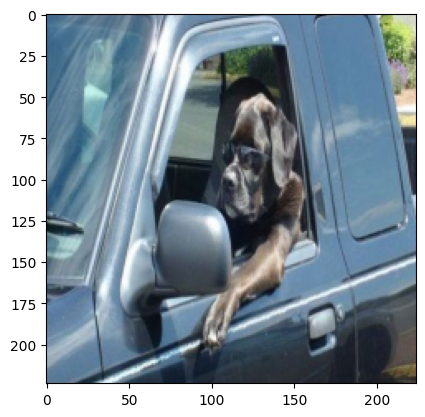

#1: p=0.853	bloodhound (163)
#2: p=0.039	washer (897)
#3: p=0.009	car_mirror (475)
#4: p=0.008	pickup (717)
#5: p=0.008	Weimaraner (178)
#6: p=0.007	Labrador_retriever (208)
#7: p=0.006	Chesapeake_Bay_retriever (209)
#8: p=0.005	limousine (627)
#9: p=0.004	pug (254)
#10: p=0.003	tub (876)


In [6]:
!wget -q https://cdn2.adrianflux.co.uk/wp-fluxposure/uploads/2014/08/no-7.jpg -O img.jpg

image = resize(plt.imread('img.jpg')[..., :3] / 255.0, (224, 224))
plt.imshow(image)
plt.show()

with torch.no_grad():
    image_tensor = torch.as_tensor(image, device=device, dtype=torch.float32)
    image_tensor = image_tensor[None].permute(0, 3, 1, 2)
    probs = torch.softmax(model(image_tensor), dim=-1)[0]

for i, class_ix in enumerate(probs.argsort(descending=True)[:10]):
    print(f"#{i + 1}: p={probs[class_ix].item():.3f}\t{class_labels[class_ix.item()]} ({class_ix.item()})")

Now let's implement SmoothGrad itself.

# two approches with noramalization and without it. also i add some expalanations about it.

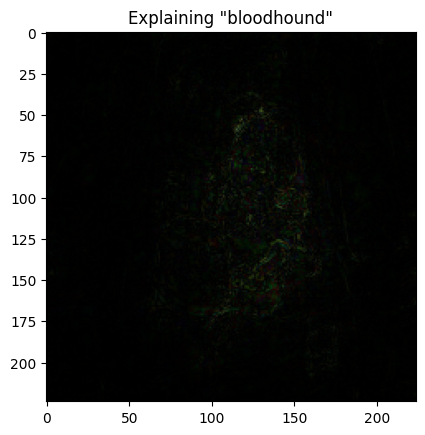

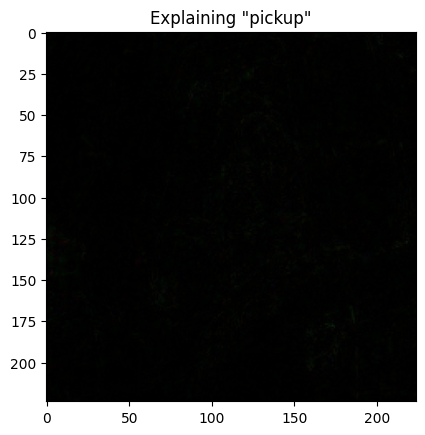

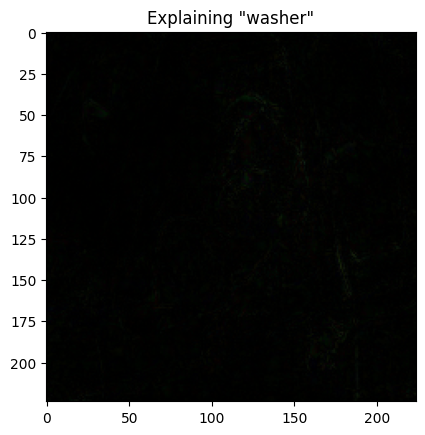

In [7]:
def explain_smoothgrad(image: torch.Tensor, class_ix, num_runs=32, sigma=0.1):
    image_tensor = torch.as_tensor(image, device=device, dtype=torch.float32)
    image_tensor = image_tensor[None].permute(0, 3, 1, 2)  # shape: [1, 3, h, w]

    grads = []
    for _ in range(num_runs):
        noisy_img = image_tensor + sigma * torch.randn_like(image_tensor)
        noisy_img.requires_grad_()

        outputs = model(noisy_img)
        logit = outputs[0, class_ix]
        model.zero_grad()
        logit.backward(retain_graph=True)

        grads.append(noisy_img.grad.detach())

    average_gradients = torch.mean(torch.stack(grads), dim=0)
    average_gradients = average_gradients.permute(0, 2, 3, 1)[0]  # [h, w, 3]

    assert tuple(average_gradients.shape) == image.shape
    return abs(average_gradients).cpu().numpy()

for class_ix in [163, 717, 897]:
    plt.title(f'Explaining "{class_labels[class_ix]}"')
    plt.imshow(explain_smoothgrad(image, class_ix), cmap='gray')
    plt.show()


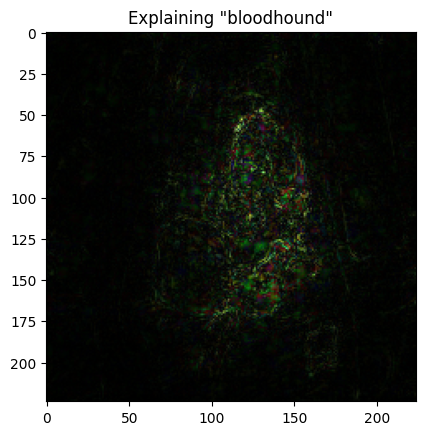

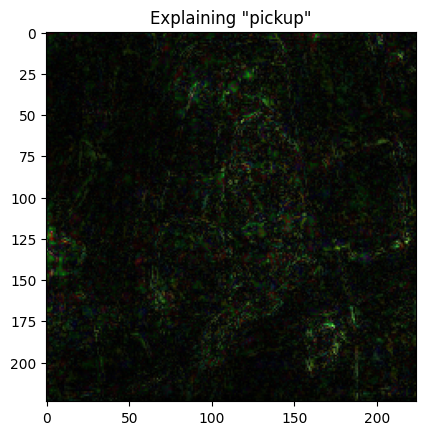

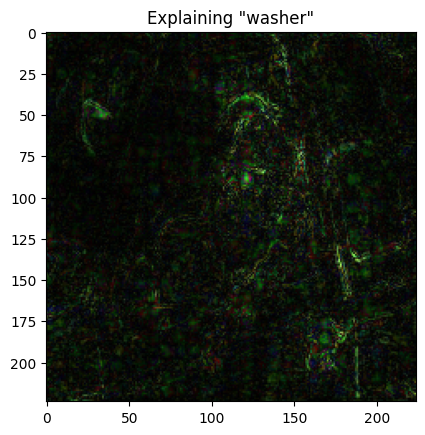

In [8]:
def explain_smoothgrad(image: torch.Tensor, class_ix, num_runs=32, sigma=0.1):
    image_tensor = torch.as_tensor(image, device=device, dtype=torch.float32)
    image_tensor = image_tensor[None].permute(0, 3, 1, 2)  # shape: [1, 3, h, w]

    grads = []
    for _ in range(num_runs):
        noisy_img = image_tensor + sigma * torch.randn_like(image_tensor)
        noisy_img.requires_grad_()

        outputs = model(noisy_img)
        logit = outputs[0, class_ix]

        model.zero_grad()
        logit.backward(retain_graph=True)

        grads.append(noisy_img.grad.detach())

    average_gradients = torch.mean(torch.stack(grads), dim=0)
    average_gradients = average_gradients.permute(0, 2, 3, 1)[0]  # reshape to (h, w, 3)

    # normalize for better visualization
    grad_abs = abs(average_gradients).cpu().numpy()
    grad_norm = (grad_abs - grad_abs.min()) / (grad_abs.max() - grad_abs.min() + 1e-8)

    assert tuple(average_gradients.shape) == image.shape
    return grad_norm

for class_ix in [163, 717, 897]:
    plt.title(f'Explaining "{class_labels[class_ix]}"')
    plt.imshow(explain_smoothgrad(image, class_ix), cmap='gray')
    plt.show()


####Obvervation: As I can see in first version (without normalization) shows very faint maps because raw gradient values are small and the second version (with normalization) rescales values between 0 and 1, making important regions clearer and easier to interpret. I think both could be correct, but the normalized version is more useful for visualization.

__Let's try it out!__ Peter Higgs nobel prize photo

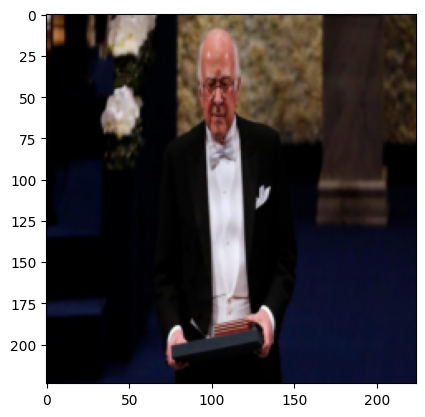

#1: p=0.211	suit (834)
#2: p=0.049	toilet_seat (861)
#3: p=0.040	plunger (731)
#4: p=0.032	vacuum (882)
#5: p=0.026	guillotine (583)
#6: p=0.024	balance_beam (416)
#7: p=0.023	academic_gown (400)
#8: p=0.022	torch (862)
#9: p=0.019	lab_coat (617)
#10: p=0.017	hook (600)


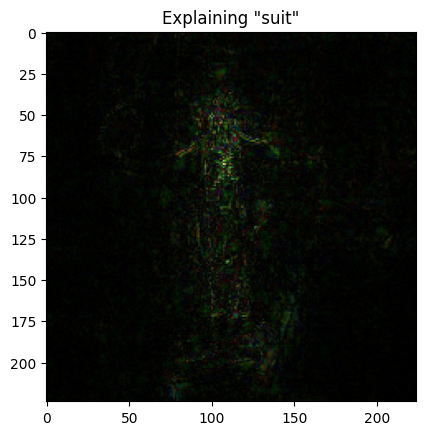

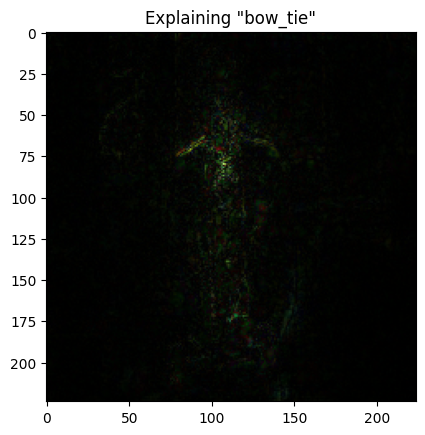

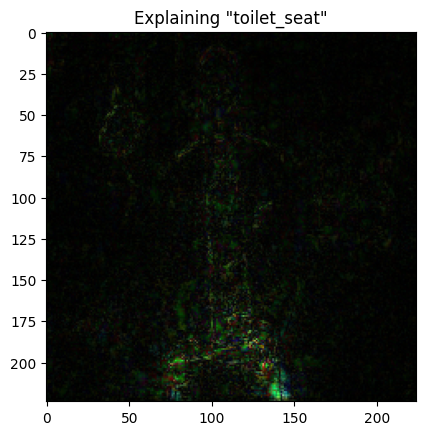

In [9]:
!wget -q https://i.pinimg.com/originals/3a/e1/83/3ae18369ab2e86be83e637ad702ec832.jpg -O img.jpg

image = resize(plt.imread('img.jpg')[..., :3] / 255.0, (224, 224))
plt.imshow(image)
plt.show()

with torch.no_grad():
    image_tensor = torch.as_tensor(image, device=device, dtype=torch.float32)
    image_tensor = image_tensor[None].permute(0, 3, 1, 2)
    probs = torch.softmax(model(image_tensor), dim=-1)[0]

for i, class_ix in enumerate(probs.argsort(descending=True)[:10]):
    print(f"#{i + 1}: p={probs[class_ix].item():.3f}\t{class_labels[class_ix.item()]} ({class_ix.item()})")

for class_ix in 834, 457, 861:
    plt.title(f'Explaining "{class_labels[class_ix]}"')
    plt.imshow(explain_smoothgrad(image, class_ix), cmap='gray')
    plt.show()

### SHapley Additive exPlanations
Now, let's try something heavier. The current state of the art in explaining model predictions is [SHAP](https://arxiv.org/abs/1705.07874): Shapley Additive Explanations.

This method is based on [Shapley values](https://en.wikipedia.org/wiki/Shapley_value) - a game-theoretic concept that evaluates the contribution of individual players in a cooperative game. Except this time our "players" are input features and the "game" is predicting whichever output the model gave.

Computing Shapley values naively requires $O(F!)$ time where F is the number of features. To make this computation more feasible, authors [proposed](https://arxiv.org/abs/1705.07874) several approximations, one of which relies on averaged gradients. This approximation also requires "background" data - other images similar to the ones in question that can be used as reference points.

In [10]:
import shap
# load "background" images - some 50 random images from ImageNet used as "other data points" for SHAP
background, _ = shap.datasets.imagenet50()
background = torch.as_tensor(background / 255.0, device=device, dtype=torch.float32)
background = background.permute(0, 3, 1, 2)
background.size()

torch.Size([50, 3, 224, 224])

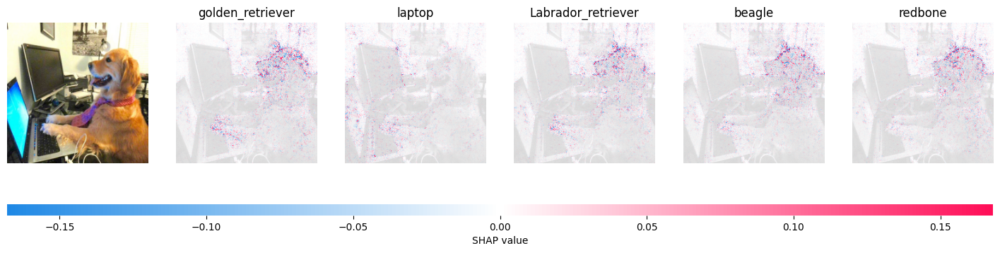

In [11]:
shap.initjs()  # run it before every (interactive) shap visualizer in colab
# v-- image to explain. If you're not using a GPU, this may take up to 20 minutes.
!wget -q https://i.pinimg.com/originals/32/da/5c/32da5c3314fcc5ebf1a7b7d1548fcb03.jpg -O img.jpg
image = resize(plt.imread('img.jpg')[..., :3] / 255.0, (224, 224))
image_tensor = torch.as_tensor(image[None], device=device, dtype=torch.float32).permute(0, 3, 1, 2)
explainer = shap.GradientExplainer((model, model.conv1), background)
shap_values, indices = explainer.shap_values(image_tensor, ranked_outputs=5, nsamples=200)
shap.image_plot(shap_values=list(np.transpose(shap_values, (4, 0, 2, 3, 1))),
                pixel_values=image_tensor.permute(0, 2, 3, 1).cpu().numpy(),
                labels=np.vectorize(lambda i: class_labels[i])(indices.cpu().numpy()))

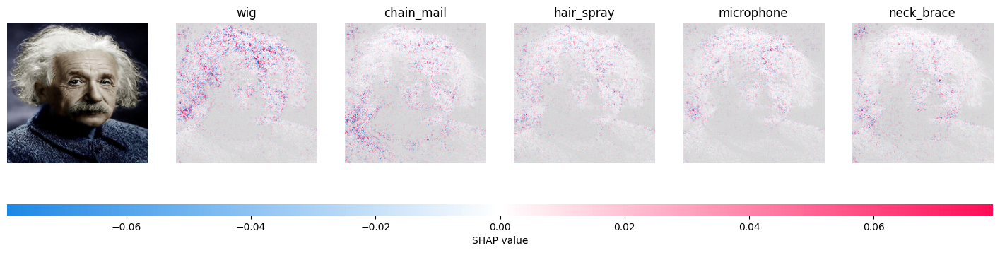

In [12]:
shap.initjs() # obligatory physicist reference
!wget -q https://images-na.ssl-images-amazon.com/images/I/51ArQaCkkZL._AC_.jpg -O img.jpg
image = resize(plt.imread('img.jpg')[..., :3] / 255.0, (224, 224))
image_tensor = torch.as_tensor(image[None], device=device, dtype=torch.float32).permute(0, 3, 1, 2)
explainer = shap.GradientExplainer((model, model.conv1), background)
shap_values, indices = explainer.shap_values(image_tensor, ranked_outputs=5, nsamples=200)
shap.image_plot(shap_values=list(np.transpose(shap_values, (4, 0, 2, 3, 1))),
                pixel_values=image_tensor.permute(0, 2, 3, 1).cpu().numpy(),
                labels=np.vectorize(lambda i: class_labels[i])(indices.cpu().numpy()))

###### Explaining classical machine learning models

Finally, let's see how SHAP explainers can be applied to more conventional machine learning models like gradient boosting.

Spoiler: exactly the same from a user's perspective. However, this time we're gonna use a different Shapley approximation implemented in TreeExplainer. For a full set of available explainers, take a look at their official [examples page](https://github.com/slundberg/shap/tree/master/notebooks).

**NB: the following cells requires JavaScript support and should work in Jupyter (not JupyterLab or cocalc)**.
In that case try running it on Google colab: https://colab.research.google.com/github/yandexdataschool/mlhep2020-assignments/blob/master/notebooks/interpretability/interpretability_demo.ipynb

In [13]:
import catboost # pip install catboost
from sklearn.datasets import fetch_california_housing
california = fetch_california_housing(as_frame=True)
X, y = california.data, california.target.values
ensemble = catboost.CatBoostRegressor(iterations=100, learning_rate=0.1)
ensemble.fit(X, y, verbose=False, plot=False)
explainer = shap.TreeExplainer(ensemble)
shap_values = explainer.shap_values(X)

shap.initjs() # visualize explanation of the first example
shap.force_plot(explainer.expected_value, shap_values[0, :], X.iloc[0, :])

In [14]:
# Explain training data: each *column* is a rotated plot from above, stacked for all training samples
shap.initjs() # (this plot is interactive, hover mouse to see feature names)
shap.force_plot(explainer.expected_value, shap_values[::100], X[::100])

### Task II: Explain Intermediate Layers of Resnet50 on ImageNet (3 points)

Sometimes, computing explanations w.r.t. pixels is more difficult (and less interpretable) than using intermediate layers that are closer to the "output" layer. The trick is to compute low-resolution explanations of output w.r.t. intermediate layer and then resizing them to fit the original image.

Each layer in deep CNN learns filters of increasing complexity. The first layers learn basic feature detection filters such as edges and corners. The middle layers learn filters that detect parts of objects — for faces, they might learn to respond to features like eyes and brows, and deeper layers capture entire objects.

**Your task** is to explain ResNet50 model outputs with respect to the convolution module from 1st, 2nd, 3rd and 4th layer of the pretrained Resnet50 network using the same GradientExplainer. *The task may require some googling or browsing the [docs](https://shap.readthedocs.io/en/latest) :)* A good starting point is from [this example](https://shap.readthedocs.io/en/latest/example_notebooks/image_examples/image_classification/Explain%20an%20Intermediate%20Layer%20of%20VGG16%20on%20ImageNet%20%28PyTorch%29.html), but for ResNet50 and on different images.

**Please use at least 10 images from across the internet (or from ImageNet) and compare the 2nd and 4th layer explanations on these images.**



Image 1: https://picsum.photos/id/237/300/300
Explaining layer1...


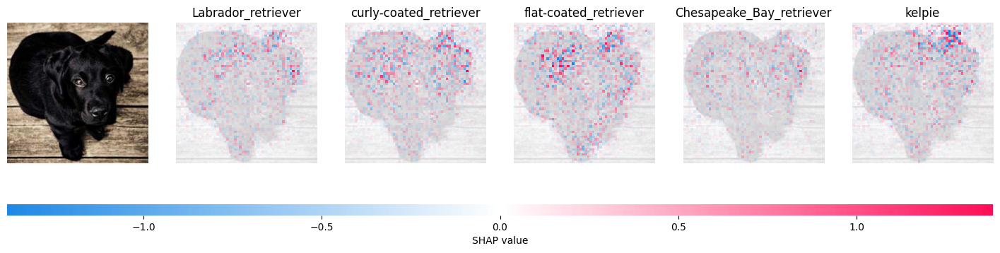

Explaining layer2...


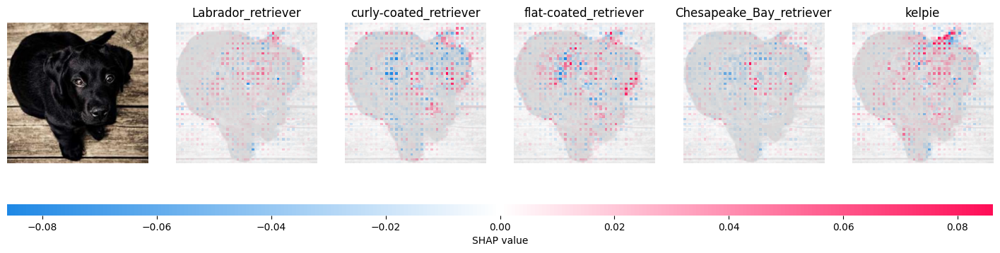

Explaining layer3...


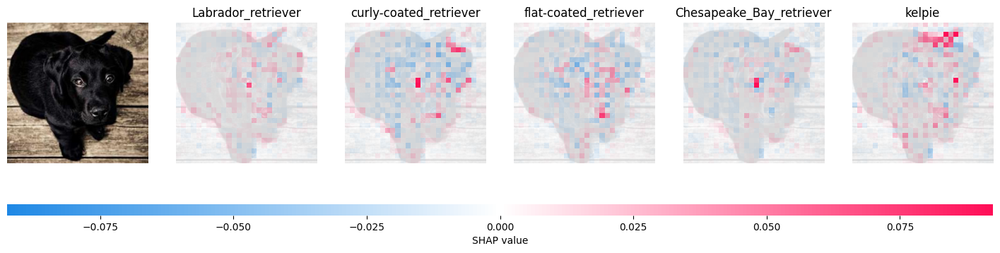

Explaining layer4...


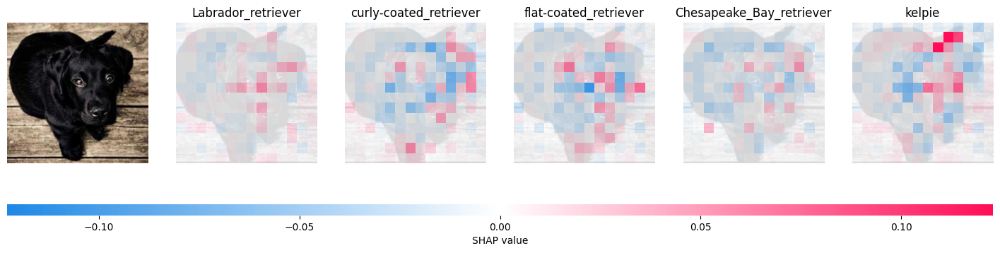


Image 2: https://picsum.photos/id/1025/300/300
Explaining layer1...


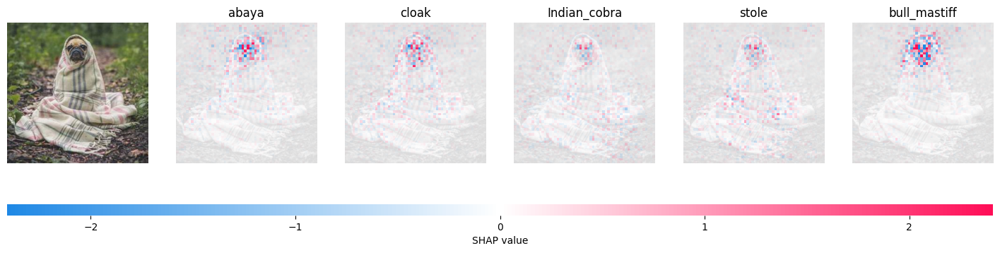

Explaining layer2...


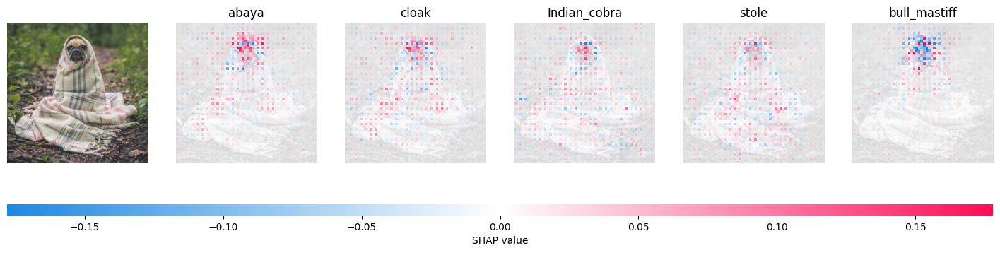

Explaining layer3...


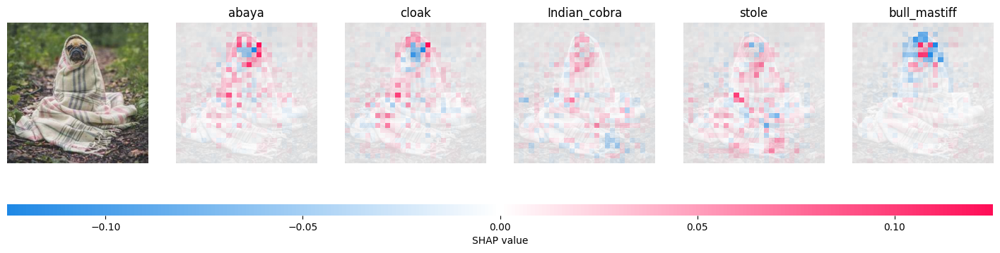

Explaining layer4...


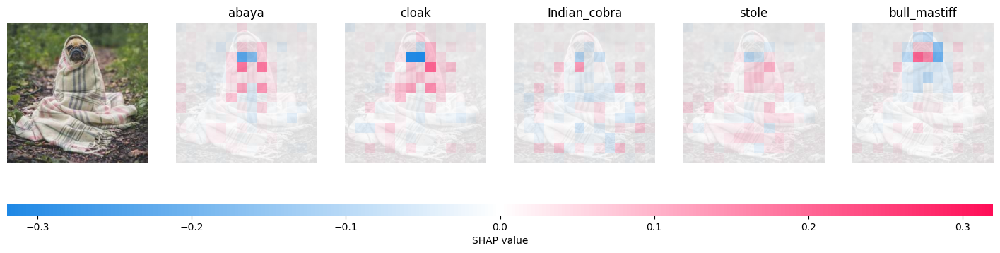


Image 3: https://picsum.photos/id/1003/300/300
Explaining layer1...


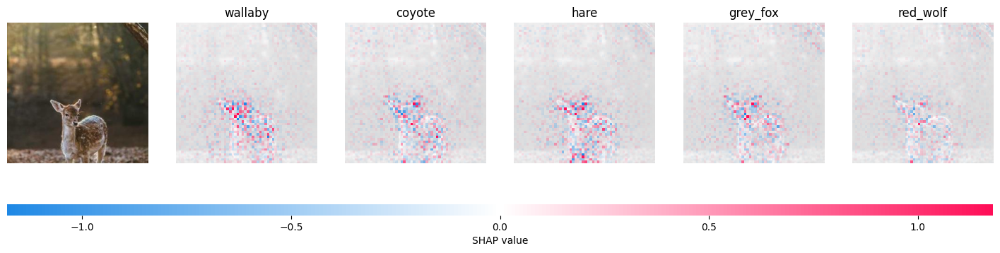

Explaining layer2...


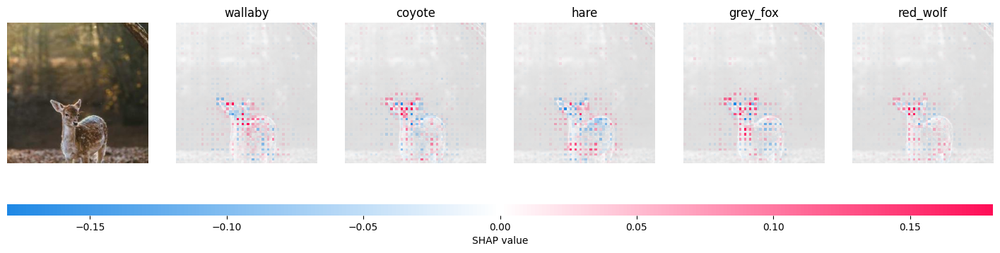

Explaining layer3...


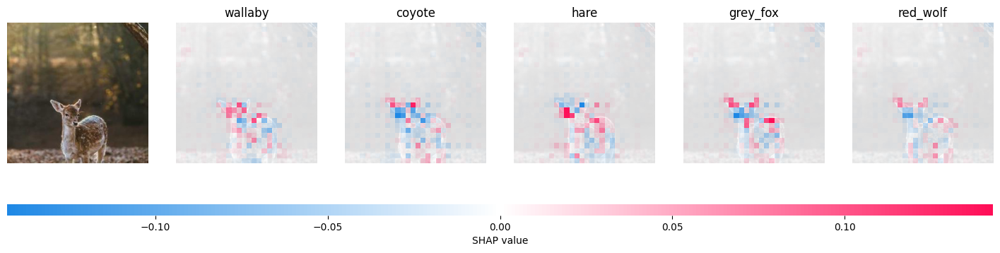

Explaining layer4...


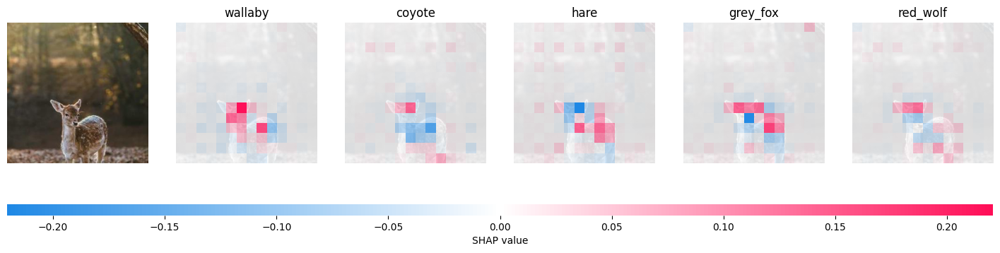


Image 4: https://picsum.photos/id/1004/300/300
Explaining layer1...


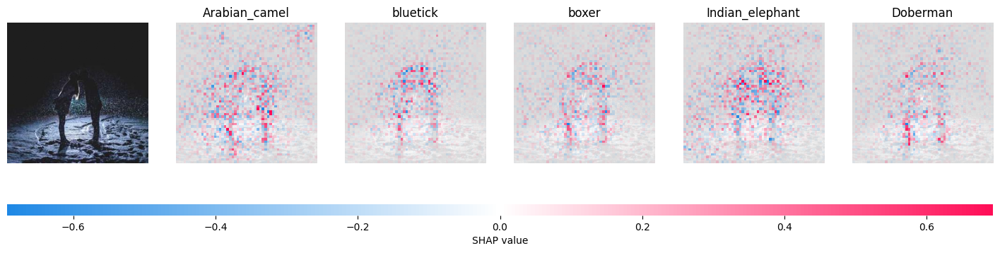

Explaining layer2...


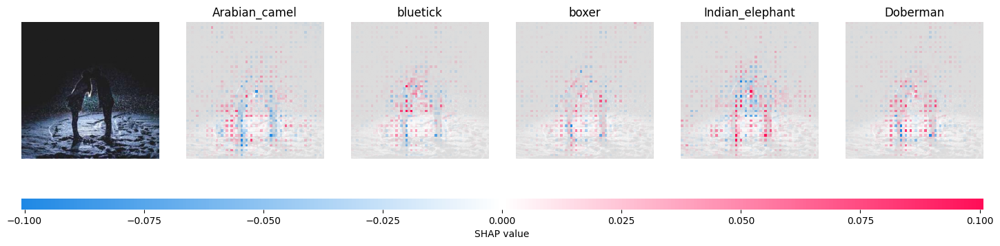

Explaining layer3...


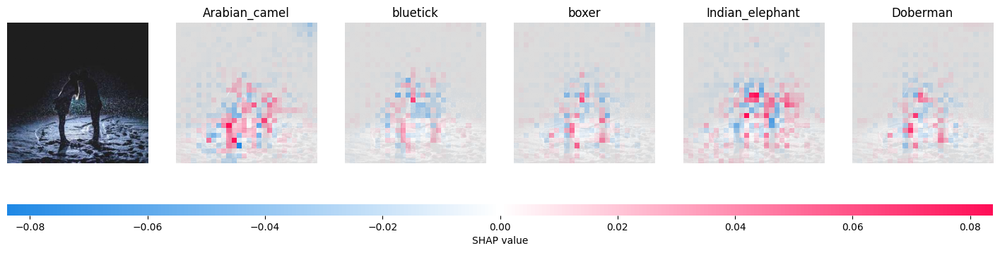

Explaining layer4...


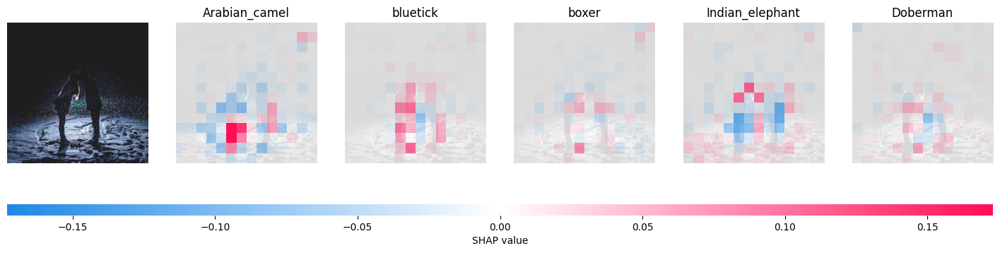


Image 5: https://picsum.photos/id/1006/300/300
Explaining layer1...


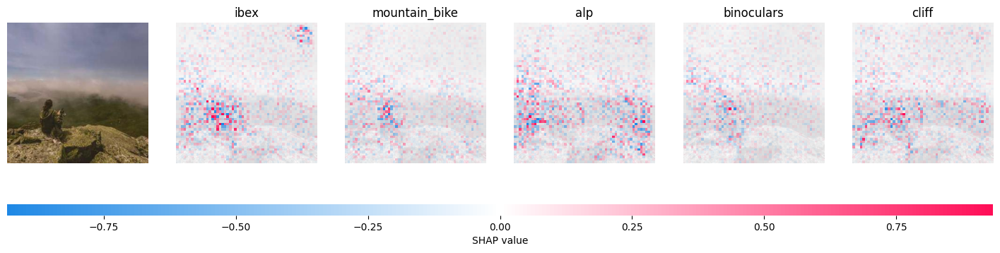

Explaining layer2...


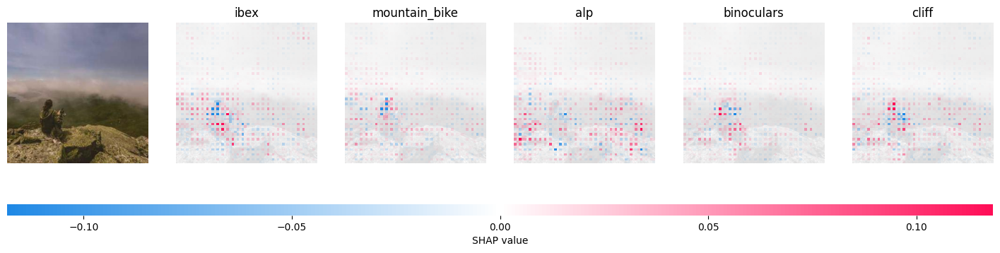

Explaining layer3...


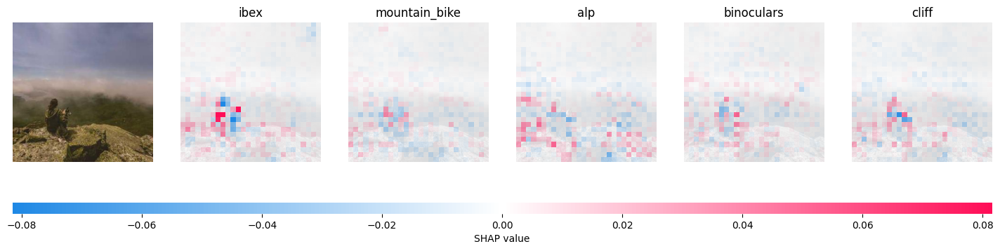

Explaining layer4...


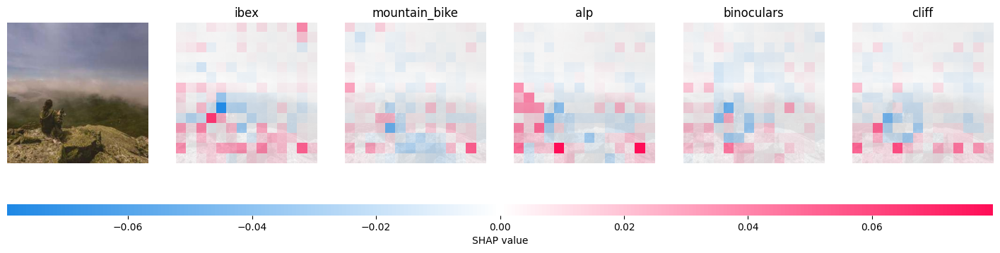


Image 6: https://picsum.photos/id/1011/300/300
Explaining layer1...


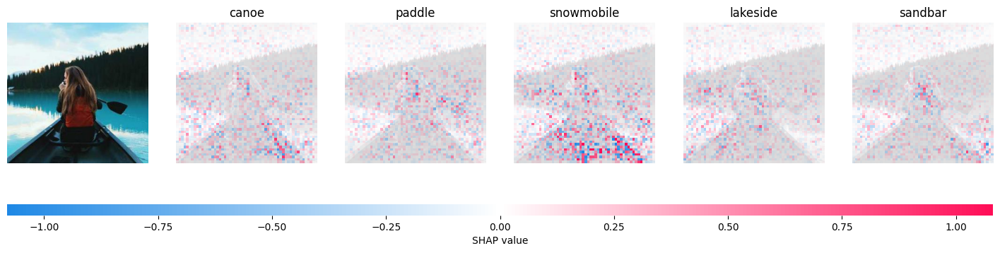

Explaining layer2...


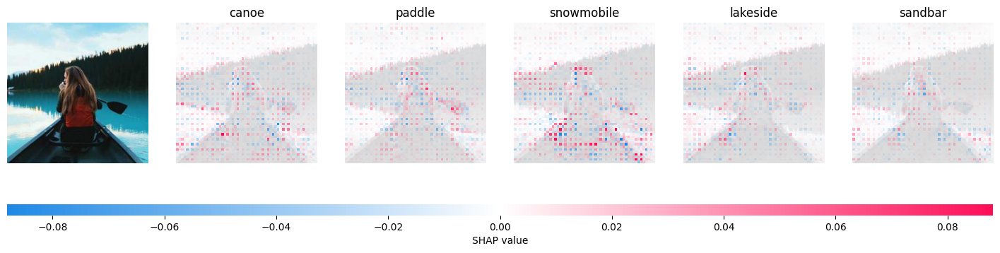

Explaining layer3...


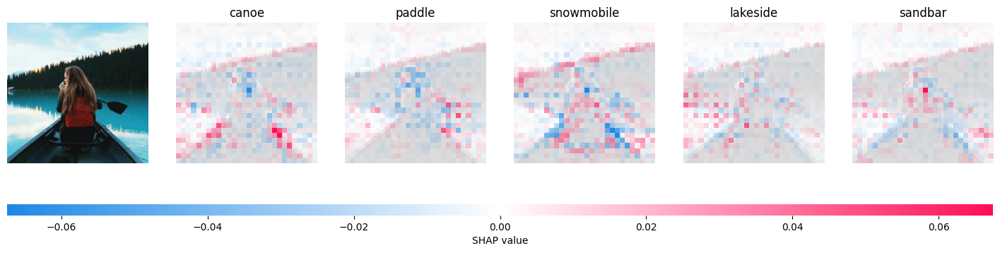

Explaining layer4...


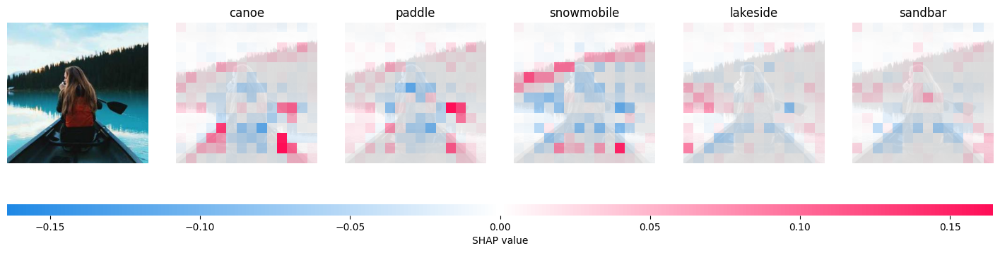


Image 7: https://picsum.photos/id/1015/300/300
Explaining layer1...


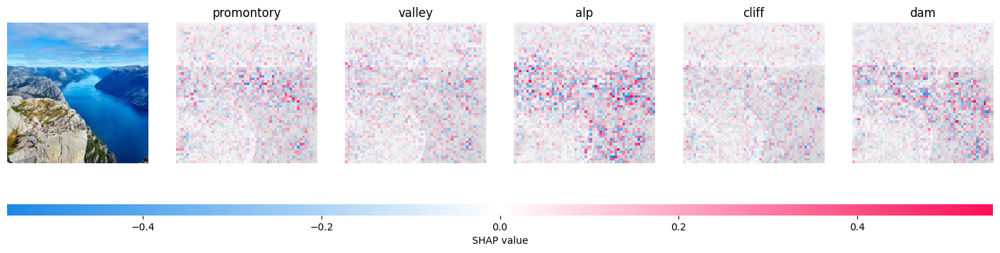

Explaining layer2...


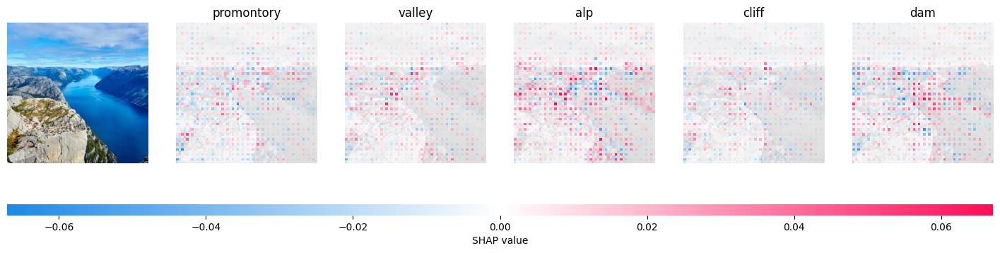

Explaining layer3...


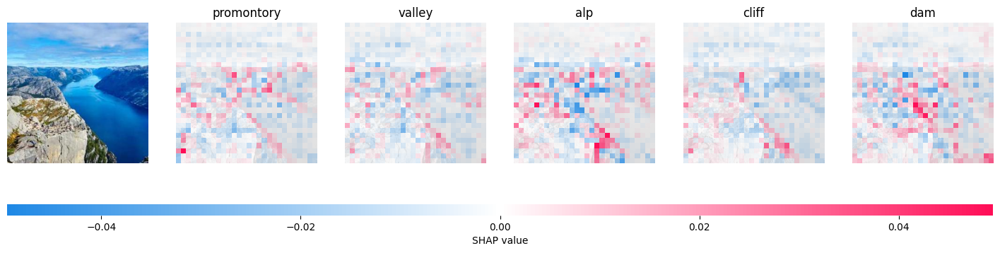

Explaining layer4...


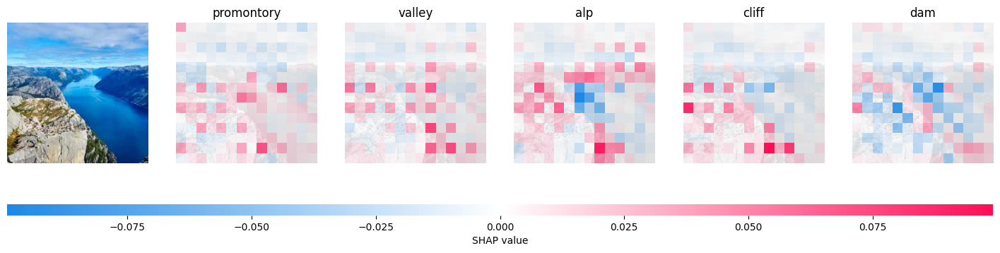


Image 8: https://picsum.photos/id/1016/300/300
Explaining layer1...


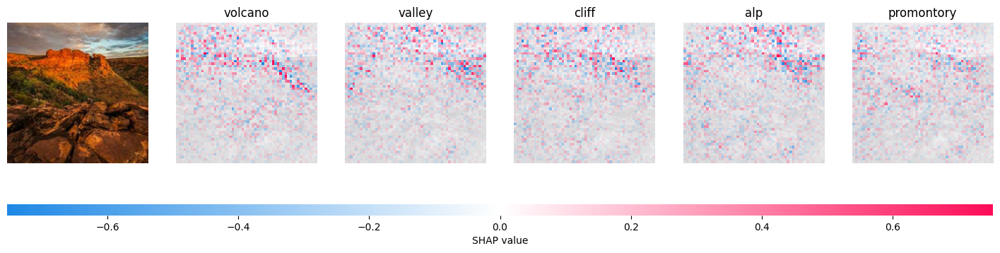

Explaining layer2...


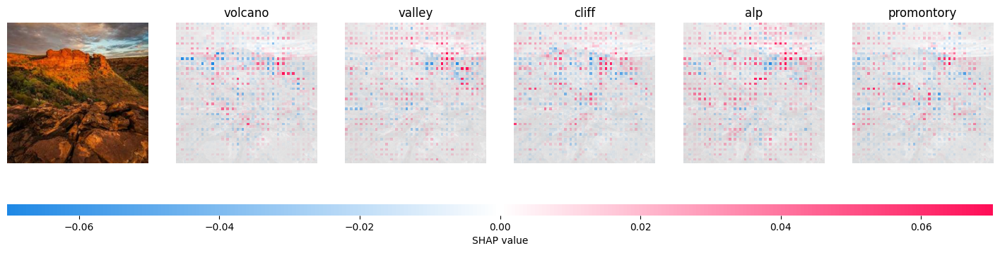

Explaining layer3...


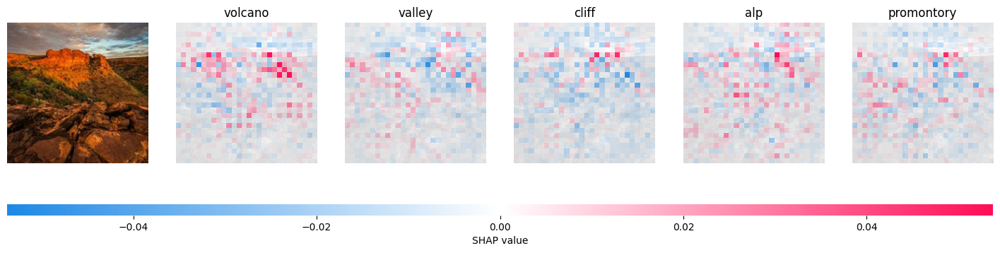

Explaining layer4...


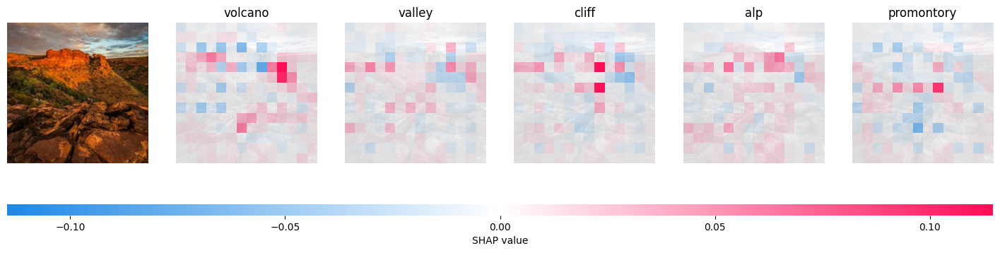


Image 9: https://picsum.photos/id/1024/300/300
Explaining layer1...


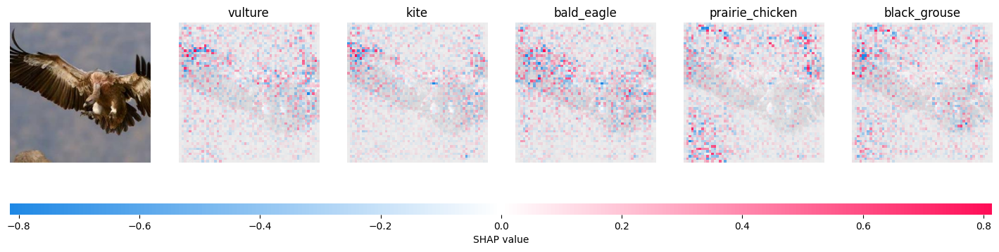

Explaining layer2...


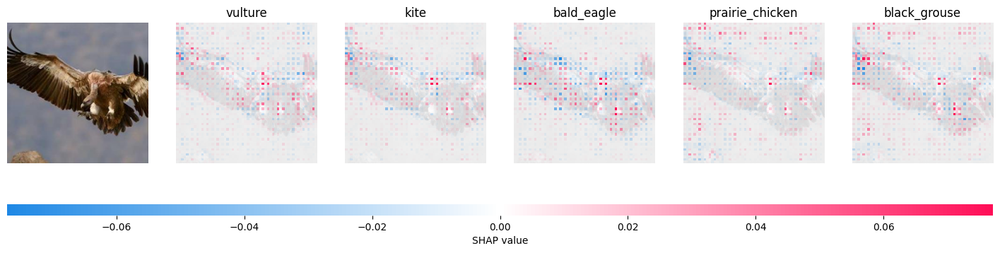

Explaining layer3...


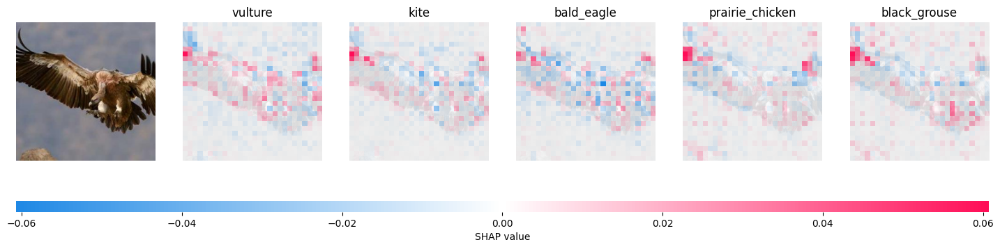

Explaining layer4...


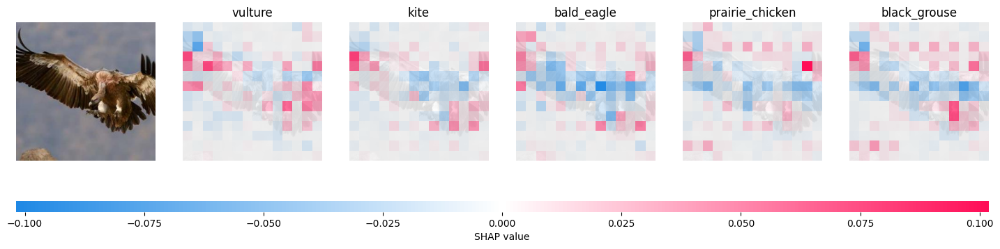


Image 10: https://picsum.photos/id/1035/300/300
Explaining layer1...


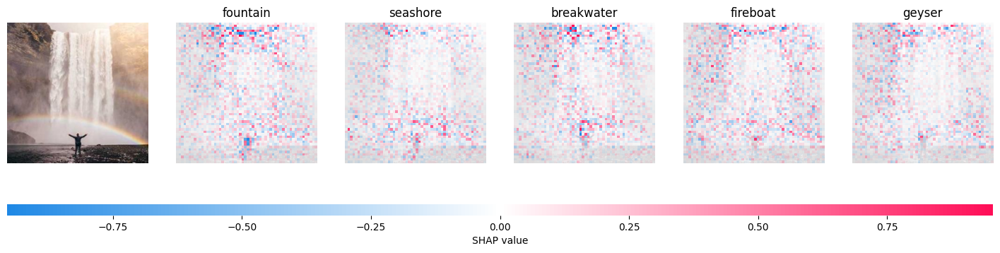

Explaining layer2...


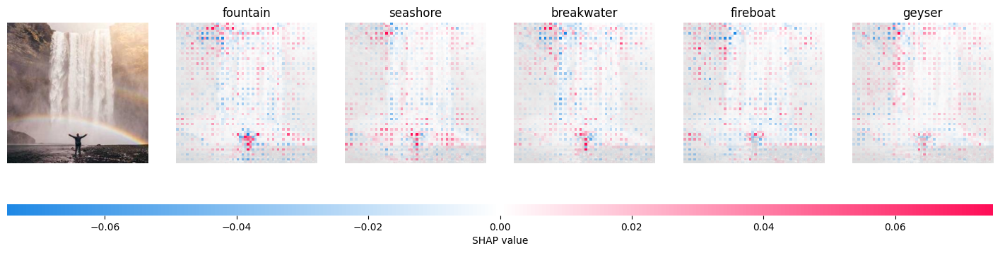

Explaining layer3...


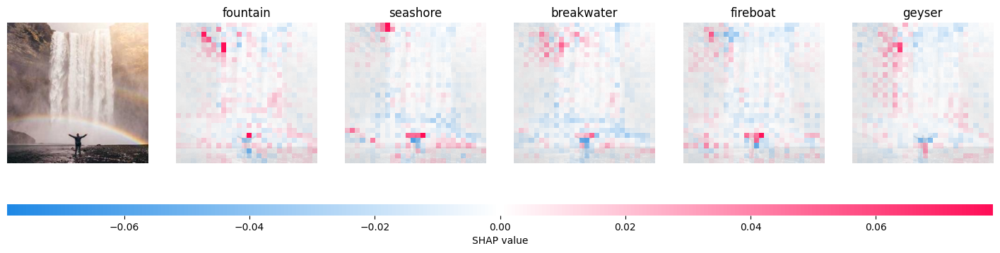

Explaining layer4...


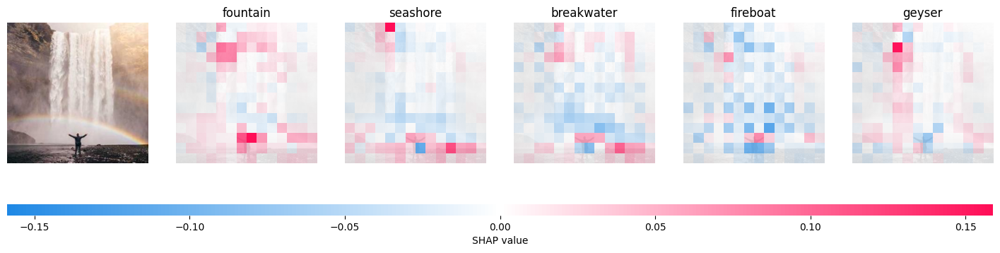

In [28]:



# Device and Model
device = "cuda" if torch.cuda.is_available() else "cpu"
weights = torchvision.models.ResNet50_Weights.DEFAULT
model = torchvision.models.resnet50(weights=weights).to(device).eval()

# Hook intermediate layers
return_nodes = {
    "layer1": "feat1",
    "layer2": "feat2",
    "layer3": "feat3",
    "layer4": "feat4"
}
extractor = create_feature_extractor(model, return_nodes=return_nodes)

# Background data for SHAP
background, _ = shap.datasets.imagenet50()
background = torch.tensor(background / 255.0, dtype=torch.float32).permute(0, 3, 1, 2).to(device)

# Safe test images (10 picsum photos)
urls = [
    "https://picsum.photos/id/237/300/300",   # dog
    "https://picsum.photos/id/1025/300/300",  # dog closeup
    "https://picsum.photos/id/1003/300/300",  # mountain
    "https://picsum.photos/id/1004/300/300",  # horse
    "https://picsum.photos/id/1006/300/300",  # building
    "https://picsum.photos/id/1011/300/300",  # sea/boat
    "https://picsum.photos/id/1015/300/300",  # forest
    "https://picsum.photos/id/1016/300/300",  # bridge
    "https://picsum.photos/id/1024/300/300",  # bird
    "https://picsum.photos/id/1035/300/300"   # person
]

# Helper to load image
def load_image(url):
    response = requests.get(url, stream=True, timeout=10)
    img = Image.open(BytesIO(response.content)).convert("RGB")
    img = img.resize((224,224))
    arr = np.array(img) / 255.0
    tensor = torch.tensor(arr[None], dtype=torch.float32).permute(0, 3, 1, 2).to(device)
    return arr, tensor

# ImageNet labels
labels_url = "https://s3.amazonaws.com/deep-learning-models/image-models/imagenet_class_index.json"
class_labels = {int(k): v[1] for k, v in requests.get(labels_url).json().items()}

# Explain function
def explain_layer(img_tensor, layer_name):
    explainer = shap.GradientExplainer((model, getattr(model, layer_name)), background)
    shap_values, indices = explainer.shap_values(img_tensor, ranked_outputs=5, nsamples=200)

    # SHAP visualization: red (positive), blue (negative)
    shap.image_plot(
        shap_values=list(np.transpose(shap_values, (4, 0, 2, 3, 1))),
        pixel_values=img_tensor.permute(0, 2, 3, 1).cpu().numpy(),
        labels=np.vectorize(lambda i: class_labels[i])(indices.cpu().numpy()),
        show=True
    )

# Run SHAP explanations
for i, url in enumerate(urls[:10]):
    print(f"\nImage {i+1}: {url}")
    img, img_tensor = load_image(url)

    for lname in ["layer1", "layer2", "layer3", "layer4"]:
        print(f"Explaining {lname}...")
        explain_layer(img_tensor, lname)


The SHAP overlays show how ResNet50 explanations evolve through its layers. In the first layer the maps are noisy, mostly reacting to edges and color contrasts. By the second layer, the focus shifts to local textures and repeating patterns. In the third layer, the network highlights meaningful object parts, and by the fourth layer the heatmaps align with the main subject, ignoring the background. Comparing layer 2 and layer 4 makes the difference clear: early layers explain fine details, while deeper layers explain whole objects. This confirms the hierarchical way CNNs move from pixels to concepts.

#some extra work and explaination, i think no need to submit but i did it to understand deeply.
just as a short example with 2 images


Image 1: https://picsum.photos/id/237/300/300
Explaining layer1...


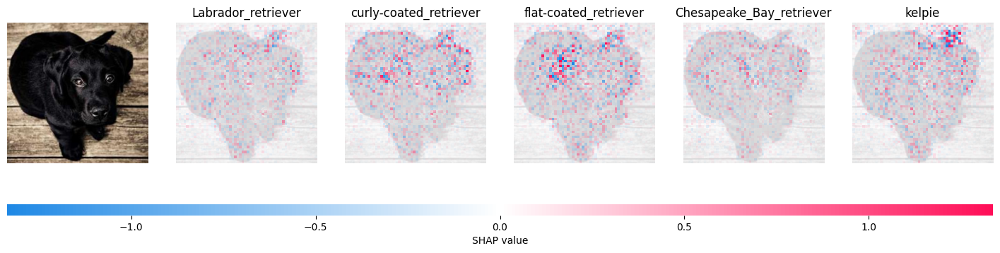

Explaining layer2...


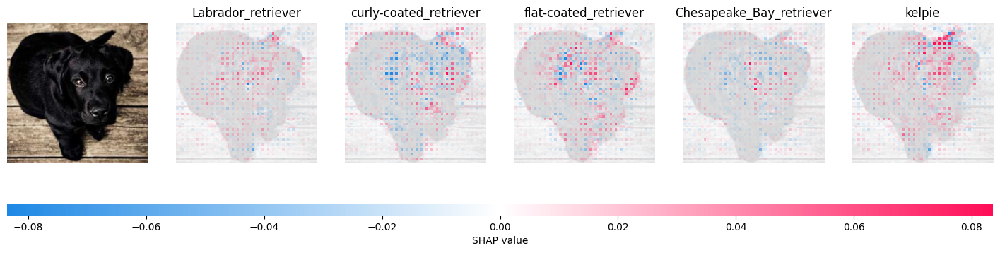

Explaining layer3...


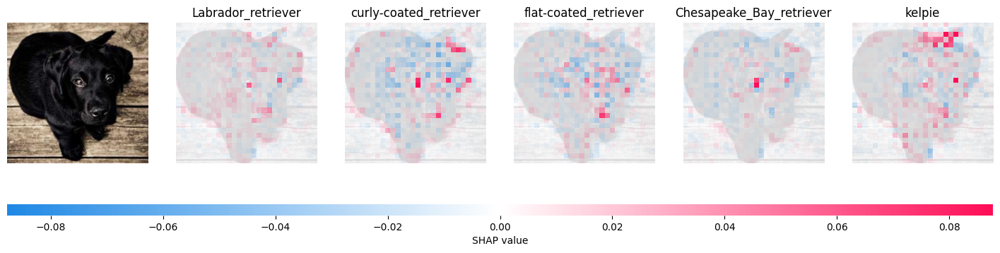

Explaining layer4...


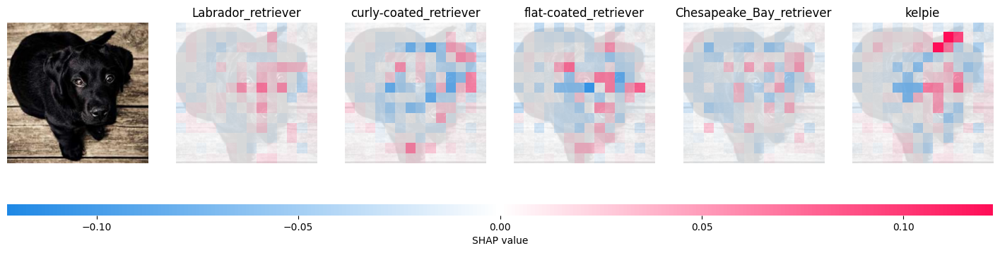


Image 2: https://picsum.photos/id/1025/300/300
Explaining layer1...


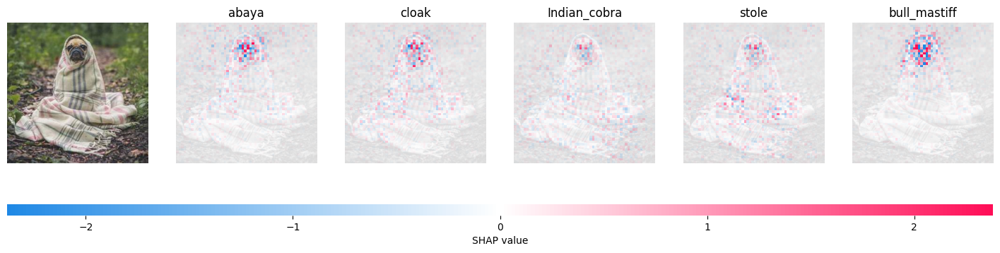

Explaining layer2...


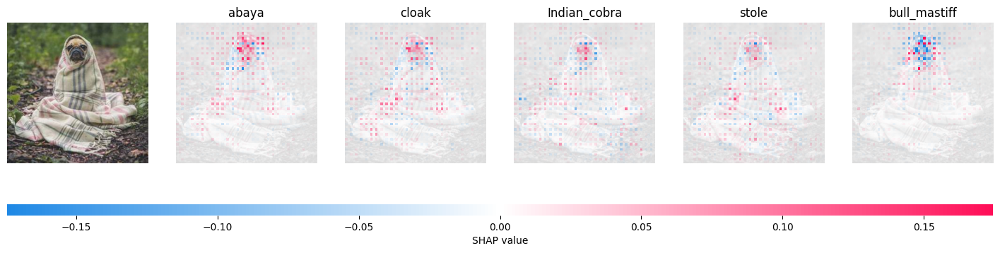

Explaining layer3...


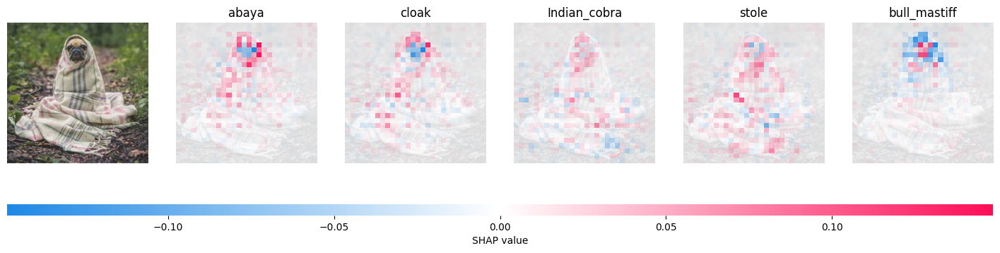

Explaining layer4...


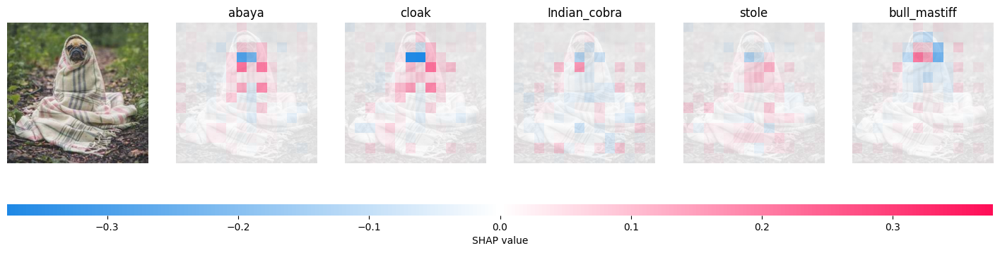

In [29]:
# Extract intermediate layers
return_nodes = {"layer1":"feat1", "layer2":"feat2", "layer3":"feat3", "layer4":"feat4"}
extractor = create_feature_extractor(model, return_nodes=return_nodes)

# Background for SHAP
background, _ = shap.datasets.imagenet50()
background = torch.tensor(background / 255.0, dtype=torch.float32).permute(0,3,1,2).to(device)

# Test images (10 safe picsum photos)
urls = [
    "https://picsum.photos/id/237/300/300",   # dog
    "https://picsum.photos/id/1025/300/300",  # dog closeup
    "https://picsum.photos/id/1003/300/300",  # mountain
    "https://picsum.photos/id/1004/300/300",  # horse
    "https://picsum.photos/id/1006/300/300",  # building
    "https://picsum.photos/id/1011/300/300",  # sea/boat
    "https://picsum.photos/id/1015/300/300",  # forest
    "https://picsum.photos/id/1016/300/300",  # bridge
    "https://picsum.photos/id/1024/300/300",  # bird
    "https://picsum.photos/id/1035/300/300"   # person
]

# Load image
def load_image(url):
    response = requests.get(url, stream=True, timeout=10)
    img = Image.open(BytesIO(response.content)).convert("RGB")
    img = img.resize((224,224))
    arr = np.array(img)/255.0
    tensor = torch.tensor(arr[None], dtype=torch.float32).permute(0,3,1,2).to(device)
    return arr, tensor

# ImageNet labels
labels_url = "https://s3.amazonaws.com/deep-learning-models/image-models/imagenet_class_index.json"
class_labels = {int(k): v[1] for k,v in requests.get(labels_url).json().items()}

# Explain with SHAP
def explain_layer(img_tensor, layer_name):
    explainer = shap.GradientExplainer((model, getattr(model, layer_name)), background)
    shap_values, indices = explainer.shap_values(img_tensor, ranked_outputs=5, nsamples=200)

    shap.image_plot(
        shap_values=list(np.transpose(shap_values, (4,0,2,3,1))),
        pixel_values=img_tensor.permute(0,2,3,1).cpu().numpy(),
        labels=np.vectorize(lambda i: class_labels[i])(indices.cpu().numpy()),
        show=True
    )

# Run explanations for first 2 images as examples
for i, url in enumerate(urls[:2]):
    print(f"\nImage {i+1}: {url}")
    img, img_tensor = load_image(url)
    for lname in ["layer1","layer2","layer3","layer4"]:
        print(f"Explaining {lname}...")
        explain_layer(img_tensor, lname)


#what I understand?

The SHAP overlays show how ResNet50 explanations evolve through its layers.
In the first layer, the maps are noisy, mainly reacting to edges and colors.
By the second layer, the focus shifts to textures and repeating patterns.
The third layer highlights object parts, while the fourth layer aligns with the whole subject, ignoring background.
Comparing layer 2 and 4 makes the difference clear: early layers explain details, while deeper layers explain full objects.
This confirms the hierarchical way CNNs transform pixels into meaningful concepts.

## References

* SHAP explainer based on superpixels - [notebook](https://slundberg.github.io/shap/notebooks/ImageNet%20VGG16%20Model%20with%20Keras.html)
* SHAP reference notebook - [view on github](https://github.com/slundberg/shap/tree/master/notebooks)
* More various explainers in [ELI5](https://github.com/TeamHG-Memex/eli5)
* Same notebook on Google [Colab](https://colab.research.google.com/github/yandexdataschool/mlhep2020-assignments/blob/master/notebooks/interpretability/interpretability_demo.ipynb)